![](pgarde1.png)

# <span style="color:yellow">Introduction

***<span style="color:red">Twitter</span> est un réseau social populaire où les utilisateurs partagent des messages appelés tweets. Twitter nous permet d’exploiter les données de tout utilisateur utilisant l’API Twitter ou Tweepy. Les données seront des tweets extraits de l’utilisateur. La première chose à faire est d’obtenir la clé du consommateur, secret du consommateur, clé d’accès et secret d’accès de développeur Twitter facilement disponible pour chaque utilisateur. Ces clés aideront l’API pour l’authentification.***

<br>***donc dans ce mini projet on a comme des objectifs:***

#### ***Objectifs :***

* Maitriser l’API de twitter pour l’extraction des tweets
* Maitriser la partie NLP (natural language processing) avec NLTK en Python
* Appliquer les principes de nettoyage des données
* Classer les tweets : regrouper ensemble les tweets qui sont similaires. C’est une étape qui peut être considérée comme une étape


# <span style="color:yellow">6. Prétraitement des tweets


### ***6.1. Extracting twitter data (tweepy + pandas)***
 

###  <center>  Importing our libraries


The requirements that we'll need to install are:

<font color='red'>NumPy:</font> This is the fundamental package for scientific computing with Python. Besides its obvious scientific uses, NumPy can also be used as an efficient multi-dimensional container of generic data.

<font color='red'>Pandas:</font> This is an open source library providing high-performance, easy-to-use data structures and data analysis tools.

<font color='red'>Tweepy:</font> This is an easy-to-use Python library for accessing the Twitter API.

<font color='red'>Matplotlib:</font> This is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms.

<font color='red'>Seaborn:</font> This is a Python visualization library based on matplotlib. It provides a high-level interface for drawing attractive statistical graphics.

<font color='red'>Textblob:</font> This is a Python library for processing textual data. It provides a simple API for diving into common natural language processing (NLP) tasks.

In [4]:
!pip install tweepy


In [5]:
!pip install nltk


In [8]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\PCS\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\PCS\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [1]:
# General:
import tweepy           # To consume Twitter's API
import pandas as pd     # To handle data
import numpy as np      # For number computing
from glob import glob
import os
# For plotting and visualization:
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Explorer la dataset NewsTweets  `combinedTweets.csv` 


## 6.2. Exploration du dataset

#### <span style="color: #C71585"> Les objectifs de cette étape consisent à :
* Comprendre le jeu des données
* Soulever les problèmes à corriger dans les données
* Extraire les informations à partir des données

***

In [2]:
# Exporter combinedTweets.csv dans un data frame nomé NewsTweets
NewsTweets= pd.read_csv("C:/Users/PCS/Desktop/3DNIs_1/ProjetDataMiningTweet/combinedTweets.csv")

# Afficher NewsTweets
NewsTweets

,TweetId,Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...
1,1337513742867836935,i can only imagine james’ understanding of chi...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate..."
3,1337512774902157315,@chopsueyside Do they have politcs in australia?
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...
...,...,...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema..."
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...
31339,1337505915520561160,RT @donwinslow: WE DEMOCRATS MUST WIN GEORGIA....
31340,1337505914925019136,"Don't use social media less ,use it more inten..."


In [3]:
NewsTweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31342 entries, 0 to 31341
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   TweetId  31342 non-null  int64 
 1   Tweet    31342 non-null  object
dtypes: int64(1), object(1)
memory usage: 489.8+ KB


In [4]:
newCombinedTweets = NewsTweets.drop_duplicates() # Drop any duplicate data
newCombinedTweets.to_csv('newCombinedTweets.csv')


In [5]:
newCombinedTweets

,TweetId,Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...
1,1337513742867836935,i can only imagine james’ understanding of chi...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate..."
3,1337512774902157315,@chopsueyside Do they have politcs in australia?
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...
...,...,...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema..."
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...
31339,1337505915520561160,RT @donwinslow: WE DEMOCRATS MUST WIN GEORGIA....
31340,1337505914925019136,"Don't use social media less ,use it more inten..."


## 6.3. Data Cleaning

#### <span style="color: #C71585"> Tâches de la préparation des données </span>
* Nettoyage des données : Identifier et corriger les erreurs, les valeurs manquantes et le format des données.
* Selection d'attributs : Identtifier les attributs (features ) les plus pertinents pour la tâche.
* Transformations des données : Modifier l'échelle ou la distribution des variables.
* Feature Engineering : Dérivation de nouveaux attributs à partir des attributs disponibles.
* Réduction de dimension : Créer des projections compactes des données pour les compresser.

***
### 6.3.1. cleaning colonne de Tweet


Les tweets contiennent des objets inutiles tels que des hashtags, des mentions, des liens et des signes de ponctuation qui peuvent affecter les performances d'un algorithme et doivent donc être supprimés.

In [6]:
tweets =newCombinedTweets.drop_duplicates()

print(tweets)

                   TweetId                                              Tweet
0      1337514187698958345  @EricRWeinstein so you too use identity politc...
1      1337513742867836935  i can only imagine james’ understanding of chi...
2      1337512998253056000  RT @MackayIM: "found that the vaccine generate...
3      1337512774902157315   @chopsueyside Do they have politcs in australia?
4      1337509066038530054  @WFEMahoney @JustAManic2020 @pablo_honey1 @rea...
...                    ...                                                ...
31337  1337505918041337858  Metrics for B2B Website, Social Media, and Ema...
31338  1337505915696713733  @hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...
31339  1337505915520561160  RT @donwinslow: WE DEMOCRATS MUST WIN GEORGIA....
31340  1337505914925019136  Don't use social media less ,use it more inten...
31341  1337505913956163590  RT @manifestive: Hope you take care of yoursel...

[31158 rows x 2 columns]


In [7]:
tweets = tweets.loc[tweets['Tweet'].replace('(www\.\w+\.com)/(\w+)',r'\1',regex=True).drop_duplicates().index]
tweets.columns=['TweetId', 'Tweet']
tweets

,TweetId,Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...
1,1337513742867836935,i can only imagine james’ understanding of chi...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate..."
3,1337512774902157315,@chopsueyside Do they have politcs in australia?
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...
...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema..."
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...


In [8]:
tweets['Processing_Tweet']=tweets['Tweet'].str.replace(r'[^\w\d\s]',' ')
tweets

,TweetId,Tweet,Processing_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein so you too use identity politc...
1,1337513742867836935,i can only imagine james’ understanding of chi...,i can only imagine james understanding of chi...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",RT MackayIM found that the vaccine generate...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic2020 pablo_honey1 rea...
...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mr_mavericck scrowder True Private companie...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum One of the many reaso...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics for B2B Website Social Media and Ema...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyon...


In [9]:
#remove punctuation, unwanted words

#####################################################

#replace urls with le vide
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'^http\://[a-zA-Z0-9\-\.]+\.[a-zA-Z]{2,3}(/\S*)?$', ' ') #removing any email or hyper link url

#replace les nombres with le vide

tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace('[0-9]+', ' ')

tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'gt', ' ')
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'boo', ' ')

#replace https with le vide
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'https', ' ') 

#suprimer les mots inutile de longueur ne dépasse pas 3
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3])) 

 #Removing RT
#tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'RT', ' ') 

#Removing https
#tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'so', ' ') 


#replace whitespaces between terms with a single space
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'\s+', ' ')


#eliminer whiteSpaces
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'^\s+|\s+?$', '')

tweets



,TweetId,Tweet,Processing_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic pablo_honey realDonaldTr...
...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mr_mavericck scrowder True Private companies s...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


In [10]:
#ajouter un nouveau colonne nommé cleaning_Tweet

######################################################


tweets['cleaning_Tweet']=tweets['Processing_Tweet']
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein identity politcs argument,EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,only imagine james understanding chinese philo...,only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",MackayIM found that vaccine generated antibodi...,MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside they have politcs australia,chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic pablo_honey realDonaldTr...,WFEMahoney JustAManic pablo_honey realDonaldTr...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mr_mavericck scrowder True Private companies s...,mr_mavericck scrowder True Private companies s...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum many reasons expect POT...,Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics Website Social Media Email Content VyX...,Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***

## 5.4. Data CleaningIntroduction to NLP: Natural Language Processing and NLTK

![](stopwords.png)

***
## <span style="color: #b25111">pre-processing  </span> 

***j'ai traité une des méthodes permettant de supprimer la ponctuation d’une chaîne de caractères en Python. Il s’agit d’une étape particulièrement utile pour le prétraitement et le nettoyage des tweets***
<br> ***je l'ai appliqué dans les deux colonnes Processing_Tweet et cleaning_Tweet***

In [11]:
import string
string.punctuation
def remove_punctuation(txt):
    txt_nopunct= "".join([c for c in txt if c.lower() not in string.punctuation])
    return txt_nopunct

In [12]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: remove_punctuation(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein identity politcs argument,EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,only imagine james understanding chinese philo...,only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",MackayIM found that vaccine generated antibodi...,MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside they have politcs australia,chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic pablohoney realDonaldTru...,WFEMahoney JustAManic pablo_honey realDonaldTr...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mrmavericck scrowder True Private companies sh...,mr_mavericck scrowder True Private companies s...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum many reasons expect POT...,Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics Website Social Media Email Content VyX...,Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


In [13]:
import string
string.punctuation
def remove_punctuation(txt):
    txt_nopunct= "".join([c for c in txt if c not in string.punctuation])
    return txt_nopunct

In [14]:
tweets['cleaning_Tweet']=tweets['cleaning_Tweet'].apply(lambda x: remove_punctuation(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein identity politcs argument,EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,only imagine james understanding chinese philo...,only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",MackayIM found that vaccine generated antibodi...,MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside they have politcs australia,chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic pablohoney realDonaldTru...,WFEMahoney JustAManic pablohoney realDonaldTru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mrmavericck scrowder True Private companies sh...,mrmavericck scrowder True Private companies sh...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum many reasons expect POT...,Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics Website Social Media Email Content VyX...,Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111"> word_tokenize  </span>

***j'ai appliqué la méthode de Tokenization pour séparer les tweets dans la colonne Processing_Tweet en des tokens (mots séparés)***

In [15]:
import re
def tokenize(txt):
    tokens = re.split('\W+', txt.lower())
    return tokens

In [16]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: tokenize(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, identity, politcs, argument]",EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[only, imagine, james, understanding, chinese,...",only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, that, vaccine, generated, an...",MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueyside, they, have, politcs, australia]",chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic, pablohoney, realdonal...",WFEMahoney JustAManic pablohoney realDonaldTru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, private, compani...",mrmavericck scrowder True Private companies sh...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[lepplady, tralalalumbum, many, reasons, expec...",Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metrics, website, social, media, email, conte...",Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvocals, joebiden, arianagrande, beyon...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111"> Stopwords  </span> 


Les <font color="red">Stop Words </font> sont des mots couramment utilisés dont la présence dans une phrase a moins de poids que d'autres mots. Ils comprennent des mots comme «et», «ou», «a» et.c.
La tokenisation est le processus de division d'une chaîne en une liste de jetons. Une phrase peut être réduite en mots et un mot peut être réduit en lettres à l'aide des tokenizers appropriés.

In [17]:
#remove stop words from text messages
import nltk
from nltk.corpus.reader.util import *
from nltk.corpus.reader.api import *

stopwords= nltk.corpus.stopwords.words('english')
stopwords


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [18]:
def remove_stopwords(txt_tokenized):
    txt_clean = [word for word in txt_tokenized if word not in stopwords]
    return txt_clean
    

In [19]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: remove_stopwords(x))

tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, identity, politcs, argument]",EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagine, james, understanding, chinese, philo...",only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccine, generated, antibodi...",MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueyside, politcs, australia]",chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic, pablohoney, realdonal...",WFEMahoney JustAManic pablohoney realDonaldTru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, private, compani...",mrmavericck scrowder True Private companies sh...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[lepplady, tralalalumbum, many, reasons, expec...",Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metrics, website, social, media, email, conte...",Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvocals, joebiden, arianagrande, beyon...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


In [20]:
#remove french stop words from Processing_Tweet 
import nltk
from nltk.corpus.reader.util import *
from nltk.corpus.reader.api import *

stopwords= nltk.corpus.stopwords.words('french')
def remove_stopwords(txt_tokenized):
    txt_clean = [word for word in txt_tokenized if word not in stopwords]
    return txt_clean
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: remove_stopwords(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, identity, politcs, argument]",EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagine, james, understanding, chinese, philo...",only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccine, generated, antibodi...",MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueyside, politcs, australia]",chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic, pablohoney, realdonal...",WFEMahoney JustAManic pablohoney realDonaldTru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, private, compani...",mrmavericck scrowder True Private companies sh...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[lepplady, tralalalumbum, many, reasons, expec...",Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metrics, website, social, media, email, conte...",Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvocals, joebiden, arianagrande, beyon...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111"> Stemmer tweets  </span>


***Le stemming consiste à réduire un mot dans sa forme « racine ». Le but du stemming est de regrouper de nombreuses variantes d’un mot comme un seul et même mot.***
<br> 
***en prend l'exemple***<br>
***---> Stemming(identity)= iden***<br>
***---> Stemming(generate)= gener***<br>
***---> Stemming(vaccine)= vaccin***<br>

In [23]:
# remove word stems using a Porter stemmer
import nltk
from nltk.stem import PorterStemmer
ps = nltk.PorterStemmer()


In [24]:
def stemming(tokenized_text):
    text=[ps.stem(word) for word in tokenized_text]
    return text

In [25]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: stemming(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, ident, politc, argument]",EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chines, philosophi,...",only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justaman, pablohoney, realdonaldt...",WFEMahoney JustAManic pablohoney realDonaldTru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, compani,...",mrmavericck scrowder True Private companies sh...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, mani, reason, expect...",Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, websit, social, media, email, content...",Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111"> Lemmatization  </span>

***La lemmatization, moins radicale, va laisser au mot un sens sémantique mais va éliminer le genre ou le pluriel par.***
<br> 
***en prend l'exemple***<br>

In [26]:
import nltk
wn = nltk.WordNetLemmatizer()
ps = nltk.PorterStemmer()

In [27]:
def lemmatization(token_txt):
    text = [wn.lemmatize(word) for word in token_txt]
    return text

In [28]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x : lemmatization(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, ident, politc, argument]",EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philosophi, ...",only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justaman, pablohoney, realdonaldt...",WFEMahoney JustAManic pablohoney realDonaldTru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, compani,...",mrmavericck scrowder True Private companies sh...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, mani, reason, expect...",Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, websit, social, medium, email, conten...",Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


In [29]:
#remove french stop words from Processing_Tweet 
import nltk
from nltk.corpus.reader.util import *
from nltk.corpus.reader.api import *

stopwords= nltk.corpus.stopwords.words('french')
def remove_stopwords(txt_tokenized):
    txt_clean = [word for word in txt_tokenized if word not in stopwords]
    return txt_clean
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: remove_stopwords(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, ident, politc, argument]",EricRWeinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philosophi, ...",only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",MackayIM found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justaman, pablohoney, realdonaldt...",WFEMahoney JustAManic pablohoney realDonaldTru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, compani,...",mrmavericck scrowder True Private companies sh...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, mani, reason, expect...",Lepplady tralalalumbum many reasons expect POT...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, websit, social, medium, email, conten...",Metrics Website Social Media Email Content VyX...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111">  appliquer stemming  et lematization on the column cleaning_text  </span>

In [30]:

tweets['cleaning_Tweet']=tweets['cleaning_Tweet'].str.lower()
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, ident, politc, argument]",ericrweinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philosophi, ...",only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",mackayim found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justaman, pablohoney, realdonaldt...",wfemahoney justamanic pablohoney realdonaldtru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, compani,...",mrmavericck scrowder true private companies sh...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, mani, reason, expect...",lepplady tralalalumbum many reasons expect pot...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, websit, social, medium, email, conten...",metrics website social media email content vyx...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals joebiden arianagrande beyonce y...


In [31]:
tweets['cleaning_Tweet']=tweets['cleaning_Tweet'].to_list()
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, ident, politc, argument]",ericrweinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philosophi, ...",only imagine james understanding chinese philo...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",mackayim found that vaccine generated antibodi...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside they have politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justaman, pablohoney, realdonaldt...",wfemahoney justamanic pablohoney realdonaldtru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, compani,...",mrmavericck scrowder true private companies sh...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, mani, reason, expect...",lepplady tralalalumbum many reasons expect pot...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, websit, social, medium, email, conten...",metrics website social media email content vyx...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals joebiden arianagrande beyonce y...


In [32]:
from nltk.corpus import stopwords
stop = stopwords.words('english','french')


tweets['cleaning_Tweet']=tweets['cleaning_Tweet'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, ident, politc, argument]",ericrweinstein identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philosophi, ...",imagine james understanding chinese philosophy...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",mackayim found vaccine generated antibodies to...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justaman, pablohoney, realdonaldt...",wfemahoney justamanic pablohoney realdonaldtru...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, compani,...",mrmavericck scrowder true private companies al...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, mani, reason, expect...",lepplady tralalalumbum many reasons expect pot...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, websit, social, medium, email, conten...",metrics website social media email content vyx...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals joebiden arianagrande beyonce y...


In [33]:
from nltk.stem import PorterStemmer
#create an object of class PorterStemmer
ps=PorterStemmer()
for word in (tweets['cleaning_Tweet']):
    
    print(f"{word}: {ps.stem(word)}")
#PorterStemmer(tweets['cleaning_Tweet'])
#porter.stem(tweets['cleaning_Tweet'])
 

ericrweinstein identity politcs argument: ericrweinstein identity politcs argu
imagine james understanding chinese philosophy history politics somehow even worse uvokpbqpcu: imagine james understanding chinese philosophy history politics somehow even worse uvokpbqpcu
mackayim found vaccine generated antibodies towards molecular clamp cross reactive tests: mackayim found vaccine generated antibodies towards molecular clamp cross reactive test
chopsueyside politcs australia: chopsueyside politcs australia
wfemahoney justamanic pablohoney realdonaldtrump true come watch leftist wmcc: wfemahoney justamanic pablohoney realdonaldtrump true come watch leftist wmcc
murpharoo tune callapilla today live coverage government abandons plans covid vaccine: murpharoo tune callapilla today live coverage government abandons plans covid vaccin
rusifhuseynov unclevugi rahimsaliyev tbalayan continue speak internal politics prllpip: rusifhuseynov unclevugi rahimsaliyev tbalayan continue speak internal poli

In [34]:
tweets['cleaning_Tweet']

0                 ericrweinstein identity politcs argument
1        imagine james understanding chinese philosophy...
2        mackayim found vaccine generated antibodies to...
3                           chopsueyside politcs australia
4        wfemahoney justamanic pablohoney realdonaldtru...
                               ...                        
31332    mrmavericck scrowder true private companies al...
31334    lepplady tralalalumbum many reasons expect pot...
31337    metrics website social media email content vyx...
31338    hyunjinsvocals joebiden arianagrande beyonce y...
31340    social media less intentionally follow people ...
Name: cleaning_Tweet, Length: 17370, dtype: object

In [35]:
tweets.to_csv('data_sample.csv')


***
## <span style="color: #b25111"> CountVectorization  </span>

***CountVectorizer crée une matrice dans laquelle chaque mot unique est représenté par une colonne de la matrice, et chaque échantillon de texte du document est une ligne dans la matrice. La valeur de chaque cellule n'est rien d'autre que le nombre de mots dans cet échantillon de texte particulier.***

In [36]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [37]:
cv = CountVectorizer(analyzer=lemmatization)
    
X = cv.fit_transform(tweets['Processing_Tweet'])
print(X.shape)

(17370, 37690)


In [38]:
print (cv.get_feature_names())

['aaaaghhhhhhh', 'aaaawwwww', 'aaagrowl', 'aaanng', 'aaassrhrl', 'aabbbbyyyyyyyy', 'aaction', 'aafcvrej', 'aahdwvegav', 'aajakudo', 'aajtak', 'aaliznat', 'aamaadmiparti', 'aamarisax', 'aamiirkhaann', 'aamir', 'aamnafasihi', 'aamullane', 'aamyax', 'aan', 'aansotmr', 'aanthanur', 'aantismark', 'aappr', 'aaqib', 'aaqr', 'aari', 'aarna', 'aaron', 'aaronbastani', 'aaroncomri', 'aarondfordnv', 'aarongrantdj', 'aaronputnam', 'aaronq', 'aaronradney', 'aaronschumm', 'aarp', 'aarpliv', 'aarpmissouri', 'aarptx', 'aav', 'aavxqa', 'abad', 'abandon', 'abashantiisound', 'abat', 'abbaacabsa', 'abbey', 'abbeydaleph', 'abbeytheatr', 'abbi', 'abbieeveraft', 'abbotsford', 'abbrevi', 'abcd', 'abcktswg', 'abclifeau', 'abcnew', 'abcnewsl', 'abcpolit', 'abcworldnew', 'abcworri', 'abcxtxwi', 'abdic', 'abdnanaesth', 'abdo', 'abdol', 'abdouljt', 'abdqywbuyf', 'abduct', 'abdulaziz', 'abdullah', 'abdullaloula', 'abdulolaitan', 'abe', 'abeebi', 'abeg', 'aberbargo', 'abet', 'abfbrain', 'abfjycixdd', 'abgk', 'abha', 

In [39]:
df= pd.DataFrame(X.toarray(), columns=cv.get_feature_names())
df

,aaaaghhhhhhh,aaaawwwww,aaagrowl,aaanng,aaassrhrl,aabbbbyyyyyyyy,aaction,aafcvrej,aahdwvegav,aajakudo,...,𝒘ᥲᥒt,𝓼tᥲrᥴყ,𝕔𝕠𝕟𝕔𝕖𝕡𝕥,𝖠𝗅𝖻𝗎𝗆,𝖲𝗂𝗇𝗀𝗅𝖾,𝗰𝗼𝗻𝗰𝗲𝗽𝘁𝘀,𝗴𝗶𝗿𝗹𝘀,𝗽𝗲𝗼𝗽𝗹𝗲,𝙍𝙀𝙋𝙀𝘼𝙏,𝙿𝚊𝚛𝚝
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17365,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17366,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17367,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17368,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


***
## <span style="color: #b25111"> TF-IDF Vectorizer  </span>

***TFIDF est une approche bag-of-words (bow) permettant de représenter les mots d’un document à l’aide d’une matrice de nombres. Le terme bow signifie que l’ordre des mots dans la phrase n’est pas pris en compte***

In [40]:
data_sample=tweets['cleaning_Tweet'][3000:13010]
data_sample

7698     indianbronson bimboubermensch jonst efncwjbtir...
7703     wish lived time popular culture divebombing di...
7704     sign petition cheech center chicano culture wo...
7707     thisisunfinishd culture shaper ginabelafonte j...
7709     justice ishaq usman bello iubello played major...
                               ...                        
24121                        social media teams cwytcqabeg
24125    never give best friend access social media acc...
24127    ghost hannahalothman high profile government a...
24129                live beyond social realism capitalism
24131    cant enjoy media moves okay sure buddy sure lo...
Name: cleaning_Tweet, Length: 10010, dtype: object

In [41]:
from sklearn.feature_extraction.text import TfidfVectorizer


tfidf = TfidfVectorizer()
#tf = tfidf.fit(data_sample)
#print(tf.vocabulary_)
#print(tfidf.get_features_names())

tf = tfidf.fit_transform(data_sample)
print(tf.shape)
print(tf)
print(tf.toarray())
df = pd.DataFrame(tf.toarray(), columns = tfidf.get_feature_names())
print(df)

(10010, 28212)
  (0, 20380)	0.33660507253539856
  (0, 11919)	0.33660507253539856
  (0, 23112)	0.32597881574621224
  (0, 20827)	0.189261971015354
  (0, 19167)	0.2334309493758015
  (0, 22848)	0.33660507253539856
  (0, 7295)	0.33660507253539856
  (0, 12794)	0.33660507253539856
  (0, 2378)	0.33660507253539856
  (0, 11615)	0.35158194030158413
  (1, 18858)	0.40916138690008724
  (1, 23355)	0.36977293742387474
  (1, 6522)	0.40916138690008724
  (1, 6508)	0.40916138690008724
  (1, 5346)	0.20177969532709422
  (1, 18843)	0.31470963022316134
  (1, 24566)	0.20160740312460337
  (1, 14380)	0.3321392967793422
  (1, 26962)	0.2651595725175584
  (2, 9493)	0.3783001345946527
  (2, 10577)	0.20413851363512825
  (2, 18692)	0.20777780937215676
  (2, 20315)	0.29565369271229175
  (2, 2956)	0.2634236464994841
  (2, 27147)	0.1962760210036964
  :	:
  (10007, 19219)	0.27300697833392196
  (10007, 3583)	0.28293320398404787
  (10007, 14477)	0.2395405515406174
  (10007, 380)	0.2926411298398149
  (10007, 10693)	0.2269648

***

# <span style="color: yellow"> 7. Classification des tweets

***
## <span style="color: #b25111"> Word2Vec </span>

In [42]:
#def

In [72]:
from gensim.models import Word2Vec
from nltk.corpus import stopwords
from string import punctuation
import pprint as pp
from sklearn.manifold import TSNE

#WordVec = gutenberg.sents(processing)
WD= Word2Vec(tweets['Processing_Tweet'])
result = WD.most_similar(positive=['covid', 'health'], negative=['social'], topn=5)
print(result)


[('hous', 0.9434698224067688), ('yahoo', 0.9416730403900146), ('vaccin', 0.9386940598487854), ('imperi', 0.9365412592887878), ('toolbeer', 0.9352211356163025)]


<ipython-input-72-248b13029ae9>:9: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  result = WD.most_similar(positive=['covid', 'health'], negative=['social'], topn=5)


In [44]:
# affichage l'un des cluster (social)

In [45]:
import matplotlib.pyplot as plt
def display_closestwords_tsnescatterplot(WD, word):
    
    arr = np.empty((0,100), dtype='f')
    word_labels = [word]

    # get close words
    close_words = WD.wv.similar_by_word(word)
    
    # add the vector for each of the closest words to the array
    arr = np.append(arr, np.array([WD[word]]), axis=0)
    for wrd_score in close_words:
        wrd_vector = WD[wrd_score[0]]
        word_labels.append(wrd_score[0])
        arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
    # find tsne coords for 2 dimensions
    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    Y = tsne.fit_transform(arr)

    x_coords = Y[:, 0]
    y_coords = Y[:, 1]
    # display scatter plot
    plt.scatter(x_coords, y_coords)

    for label, x, y in zip(word_labels, x_coords, y_coords):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
    plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
    plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
    plt.show()

<ipython-input-45-39650eadd45a>:11: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  arr = np.append(arr, np.array([WD[word]]), axis=0)
<ipython-input-45-39650eadd45a>:13: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  wrd_vector = WD[wrd_score[0]]


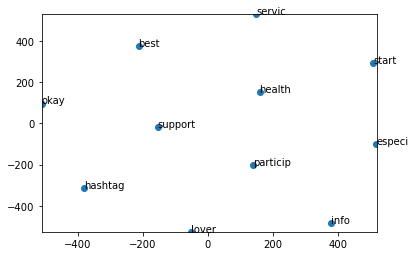

In [46]:
display_closestwords_tsnescatterplot(WD, 'health')


***
## <span style="color: #b25111"> K-Means : the method of cosine_distance </span>

***Cosine similarity is a metric used to measure how similar documents are irrespective of their size. Mathematically, it measures the cosine of the angle between two vectors projected in a multi-dimensional space. This would involve creating word vectors for the set of words and all the tweets then performing the cosine similarity.*** 
<br>***TFIDF (bag of words model) Vectorizer would be ideal for the vectorization.***

***je l'ai appliqué dans la colonne processing_Tweet***

## <span style="color:red"> nbr_cluster =3

In [47]:


from nltk.cluster import KMeansClusterer
import nltk
X = WD[WD.wv.vocab]
NUM_CLUSTERS=3
kclusterer = KMeansClusterer(NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance, repeats=25)
assigned_clusters = kclusterer.cluster(X, assign_clusters=True)
print (assigned_clusters)

<ipython-input-47-62f2aa1eff1b>:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  X = WD[WD.wv.vocab]


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [48]:
words = list(WD.wv.vocab)
for i, word in enumerate(words):  
    print (word + ":" + str(assigned_clusters))

ericrweinstein:[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



concept:[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




mango:[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [49]:
from sklearn import cluster
from sklearn import metrics

kmeans = cluster.KMeans(n_clusters=NUM_CLUSTERS)
kmeans.fit(X)
 
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
 
print ("Cluster id labels for inputted data")
print (labels)
print ("Centroids data")
print (centroids)
 
print ("Score (Opposite of the value of X on the K-means ----> is Sum of distances of samples to their closest cluster center):")
print (kmeans.score(X))
 


Cluster id labels for inputted data
[0 2 1 ... 0 0 0]
Centroids data
[[ 0.00047315 -0.06044588 -0.04284336 -0.01994156 -0.01078246  0.0537513
  -0.1686323  -0.08324527  0.05868771  0.04087775  0.09924421  0.04532776
  -0.08597615 -0.07355366  0.07578449 -0.03609037 -0.01644165  0.11740684
  -0.05008082  0.0055953  -0.0263958  -0.01336938 -0.03265221 -0.0599019
   0.08416816  0.03227639  0.01724394 -0.01525615 -0.0930319  -0.05205487
   0.00477554 -0.1167403   0.1317732  -0.04451865 -0.04169298  0.00594948
   0.0225959  -0.01224019  0.0528871   0.03871637 -0.04548379  0.02958116
   0.05128932  0.03542083  0.05137208 -0.07766306  0.03692535 -0.03879899
  -0.09806823 -0.07543506  0.02416174 -0.09363107  0.03312575  0.00548266
  -0.06731012 -0.07198665 -0.13196039  0.00480471 -0.03174885  0.09324538
   0.08900813  0.01925756  0.04650318  0.09475995  0.01651937 -0.04958752
  -0.02962224 -0.07645798 -0.06784988 -0.00805644 -0.01624042  0.08086531
   0.10618582  0.16119829 -0.00223811  0.0309

KeyError: 0

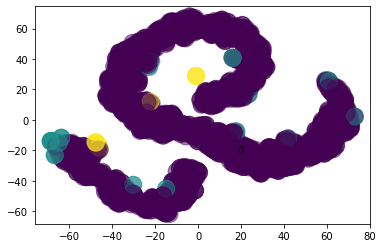

In [51]:
import matplotlib.pyplot as plt
 
from sklearn.manifold import TSNE

model = TSNE(n_components=2, random_state=0)
np.set_printoptions(suppress=True) 
Y=model.fit_transform(X)
plt.scatter(Y[:, 0], Y[:, 1], c=assigned_clusters, s=290,alpha=.5)
for j in range(len(data_sample)):    
    
    plt.annotate(assigned_clusters[j],xy=(Y[j][0], Y[j][1]),xytext=(0,0),textcoords='offset points')
    print("%s %s" % (assigned_clusters[j],  data_sample[j]))
plt.show()

***

In [ ]:
#Visualization through PCA (principal component analysis)¶


D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 49828 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 53580 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 51060 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 50472 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 49828 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 53580 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\anaconda\lib\site-packages\ma

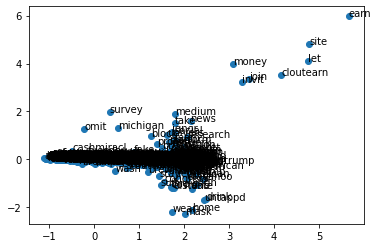

In [52]:
from sklearn.decomposition import PCA
from matplotlib import pyplot
# fit a 2d PCA model to the vectors

pca = PCA(n_components=2)
result = pca.fit_transform(X)

# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(WD.wv.vocab)

for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

***
## <span style="color: #b25111"> K-Means : the method of MiniBatchKMeans </span>

***Mini Batch K-means algorithm‘s main idea is to use small random batches of data of a fixed size, so they can be stored in memory.***
<br>***Each iteration a new random sample from the dataset is obtained and used to update the clusters and this is repeated until convergence.***

***je l'ai appliqué dans la colonne cleaning_Tweet***

## <span style="color: red"> K-means = 25

In [53]:

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.cluster import KMeans

from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [54]:
tfidf = TfidfVectorizer(
    min_df = 5,
    max_df = 0.95,
    max_features = 100,
    stop_words = 'english'
)
tf = tfidf.fit_transform(data_sample)


Fit 1 clusters
Fit 2 clusters
Fit 3 clusters
Fit 4 clusters
Fit 5 clusters
Fit 6 clusters
Fit 7 clusters
Fit 8 clusters
Fit 9 clusters
Fit 10 clusters
Fit 11 clusters
Fit 12 clusters
Fit 13 clusters
Fit 14 clusters
Fit 15 clusters
Fit 16 clusters
Fit 17 clusters
Fit 18 clusters
Fit 19 clusters
Fit 20 clusters


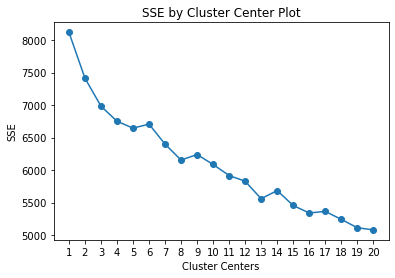

In [55]:
def find_optimal_clusters(data_sample, max_k):
    iters = range(1, max_k+1, 1)
    
    sse = []
    for k in iters:
        sse.append(MiniBatchKMeans(n_clusters=k, init_size=1024, batch_size=2048, random_state=5).fit(data_sample).inertia_)
        print('Fit {} clusters'.format(k))
        
    f, ax = plt.subplots(1, 1)
    ax.plot(iters, sse, marker='o')
    ax.set_xlabel('Cluster Centers')
    ax.set_xticks(iters)
    ax.set_xticklabels(iters)
    ax.set_ylabel('SSE') # Most common measure is Sum of Squared Error (SSE),For each point, the error is the distance to the nearest cluster

    ax.set_title('SSE by Cluster Center Plot')
 #One easy way to reduce SSE is to increase K, the number of clusters
    
find_optimal_clusters(tf, 20)

## nbr_cluster =25

In [63]:
clusters = MiniBatchKMeans(n_clusters=25, init_size=1024, batch_size=2048, random_state=10000).fit_predict(tf)

In [64]:
# Plotting Clusters

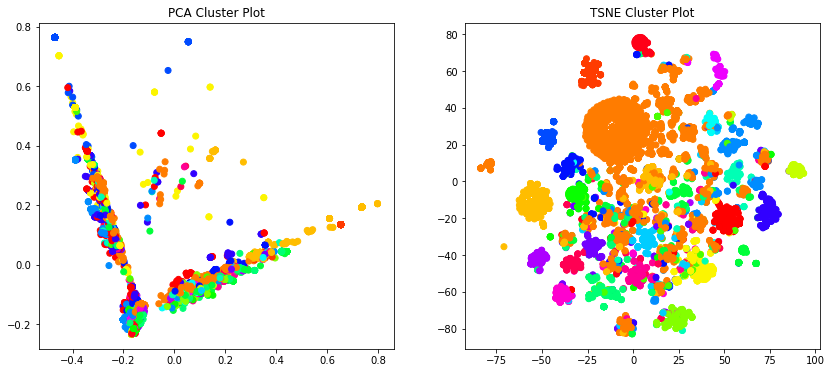

In [65]:
def plot_tsne_pca(data_sample, labels):
    max_label = max(labels)
    max_items = np.random.choice(range(data_sample.shape[0]), size=10000, replace=False)
    
    pca = PCA(n_components=3).fit_transform(data_sample[max_items,:].todense())
    tsne = TSNE().fit_transform(PCA(n_components=50).fit_transform(data_sample[max_items,:].todense()))
    
    
    idx = np.random.choice(range(pca.shape[0]), size=10000, replace=False)
    label_subset = labels[max_items]
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]
    
    f, ax = plt.subplots(1, 2, figsize=(14, 6))
    
    ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
    ax[0].set_title('PCA Cluster Plot')
    
    ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
    ax[1].set_title('TSNE Cluster Plot')
    
plot_tsne_pca(tf, clusters)

In [59]:
# Top Keywords

In [66]:
def get_top_keywords(data_sample, clusters, labels, n_terms):
    df = pd.DataFrame(data_sample.todense()).groupby(clusters).mean()
    
    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(','.join([labels[t] for t in np.argsort(r)[-n_terms:]]))
            
get_top_keywords(tf, clusters, tfidf.get_feature_names(), 30)


Cluster 0
business,right,want,know,like,government,team,real,money,home,work,vaccine,help,make,year,community,time,support,world,free,need,cases,pandemic,social,mental,people,covid,workers,health,care

Cluster 1
culture,friends,friday,house,look,live,like,life,lets,justice,join,inviting,important,getting,years,home,holiday,help,health,happy,great,government,good,going,know,make,post,come,december,social

Cluster 2
support,week,government,state,years,read,love,white,team,pandemic,security,great,money,check,make,world,trump,vaccine,help,today,year,think,join,media,want,justice,work,know,health,social

Cluster 3
thing,live,things,read,days,tell,support,want,getting,going,work,year,says,share,school,week,health,today,friends,make,help,team,love,inviting,think,know,post,marketing,social,media

Cluster 4
said,covid,christmas,friends,great,talk,years,family,best,things,media,school,work,think,thing,want,black,police,social,community,know,going,support,pandemic,year,like,help,people,health,me

***
## <span style="color: #b25111"> WordCloud </span>

In [67]:
!pip install WordCloud

## **<center> <span style="color: #b25111"> The world cloud on the Cleaning_TweetColumn***

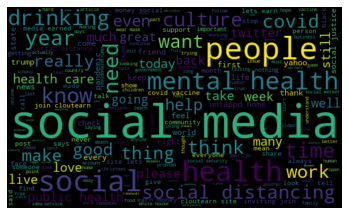

In [62]:
from wordcloud import WordCloud 

allWords = ' '.join([term for term in data_sample] )
wordCloud = WordCloud(width =500, height=300, random_state=21, max_font_size = 119).generate(allWords)

plt.imshow(wordCloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

In [14]:
pip list

Package                            VersionNote: you may need to restart the kernel to use updated packages.

---------------------------------- -------------------
absl-py                            0.11.0
alabaster                          0.7.12
altair                             4.1.0
anaconda-client                    1.7.2
anaconda-navigator                 1.9.12
anaconda-project                   0.8.3
argh                               0.26.2
asn1crypto                         1.3.0
astroid                            2.4.2
astropy                            4.0.1.post1
astunparse                         1.6.3
atomicwrites                       1.4.0
attrs                              19.3.0
autopep8                           1.5.3
Babel                              2.8.0
backcall                           0.2.0
backports.functools-lru-cache      1.6.1
backports.shutil-get-terminal-size 1.0.0
backports.tempfile                 1.0
backports.weakref                  1.0.post1
bcr

***

# <span style="color:yellow"> Conclusion

***As a conclusion, I found that the cosine similarity is good for cases where duplication matters***    
<br>***Mini batch k-means has the main advantage of reducing of computational cost of finding a partition.***
<br>***This cost is proportional to the size of the sample batch used and this difference is more evident when the number of clusters is larger.***
    
<br>***I tryed to work with the Jaccard Similarity methode because is good for cases where duplication does not matter (the context matters) but performance problem occured***
